In [1]:
# * * * * * * * * * * * * * * * *
# Configuration
# * * * * * * * * * * * * * * * *
DATASET_DIR = '/workspace/datasets'
OUTPUT_DIR = '/workspace/outputs'

DEVICE= 'cpu'

In [2]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import IncrementalPCA
from itertools import combinations
from scipy.stats import wasserstein_distance

from lunar_vae import VAE, train, SampleLatentSpace, VisualizeLatentSpace
from utils import (
    GenerateDensityPlot,
    LoadTemperatureDataV2
)

# * * * * * * * * * * * * * * * *
# Setting Variables
# * * * * * * * * * * * * * * * *
INPUT_CSV_PATH = os.path.join(DATASET_DIR, f'profiles-v2', f'profiles-v2.csv')

In [3]:
# * * * * * * * * * * * * * * * *
# Load Temp Data
# * * * * * * * * * * * * * * * *
temp_data = LoadTemperatureDataV2(INPUT_CSV_PATH, DEVICE)

Loading Profiles: 3891424it [03:57, 16352.49it/s]


Fitting IncrementalPCA...


Fitting: 100%|██████████| 39/39 [01:13<00:00,  1.89s/it]


Transforming with IncrementalPCA...


Transforming: 100%|██████████| 39/39 [00:01<00:00, 26.97it/s]


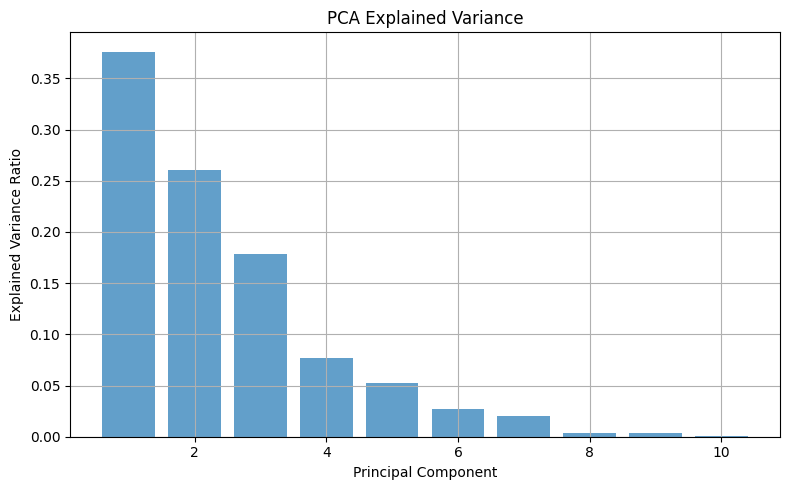

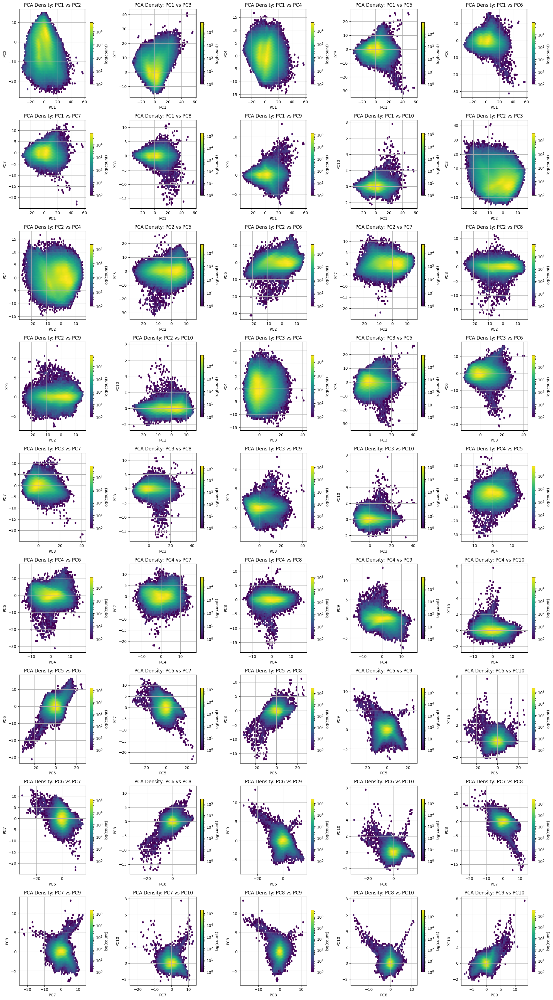

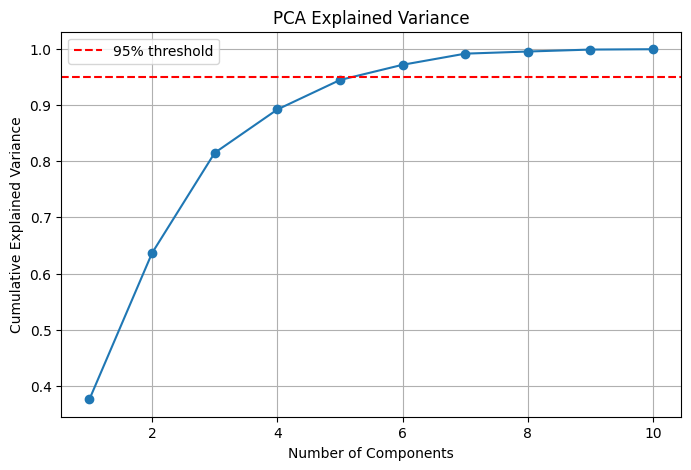

In [5]:
# * * * * * * * * * * * * * * * *
# Convert to numpy
# * * * * * * * * * * * * * * * *
temp_data_np = temp_data.numpy() 

# * * * * * * * * * * * * * * * *
# Setting Up for PCA
# * * * * * * * * * * * * * * * *
n_components = 10
batch_size = 100_000

# * * * * * * * * * * * * * * * *
# Standardize data
# * * * * * * * * * * * * * * * *
scaler = StandardScaler()
temp_data_scaled = scaler.fit_transform(temp_data_np)

# * * * * * * * * * * * * * * * *
# PCA Fitting
# * * * * * * * * * * * * * * * *
n_samples = temp_data_scaled.shape[0]
n_batches = n_samples // batch_size + int(n_samples % batch_size != 0)

ipca = IncrementalPCA(n_components=n_components)

print("Fitting IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Fitting"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    ipca.partial_fit(batch)

X_pca = np.zeros((n_samples, n_components))

print("Transforming with IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Transforming"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    X_pca[start:end] = ipca.transform(batch)

# * * * * * * * * * * * * * * * *
# Plot Variance 
# * * * * * * * * * * * * * * * *
# Plot variance explained
plt.figure(figsize=(8, 5))
plt.bar(range(1, n_components + 1), ipca.explained_variance_ratio_, alpha=0.7)
plt.ylabel("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Pair-wise Plots
# * * * * * * * * * * * * * * * *
pcs = X_pca[:, :n_components]
pairs = list(combinations(range(n_components), 2))

n_pairs = len(pairs)
cols = 5  
rows = (n_pairs + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)

for idx, (x_idx, y_idx) in enumerate(pairs):
    row = idx // cols
    col = idx % cols
    ax = axes[row, col]
    
    hb = ax.hexbin(pcs[:, x_idx], pcs[:, y_idx], gridsize=50, cmap='viridis', bins='log')
    ax.set_xlabel(f"PC{x_idx + 1}")
    ax.set_ylabel(f"PC{y_idx + 1}")
    ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1}")
    ax.grid(True)
    
    cb = fig.colorbar(hb, ax=ax, shrink=0.7)
    cb.set_label('log(count)')

for idx in range(n_pairs, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Scree Plot
# * * * * * * * * * * * * * * * *
explained_var_ratio = ipca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_var_ratio)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.legend()
plt.show()

Fitting IncrementalPCA...


Fitting: 100%|██████████| 39/39 [01:16<00:00,  1.95s/it]


Transforming with IncrementalPCA...


Transforming: 100%|██████████| 39/39 [00:01<00:00, 32.80it/s]


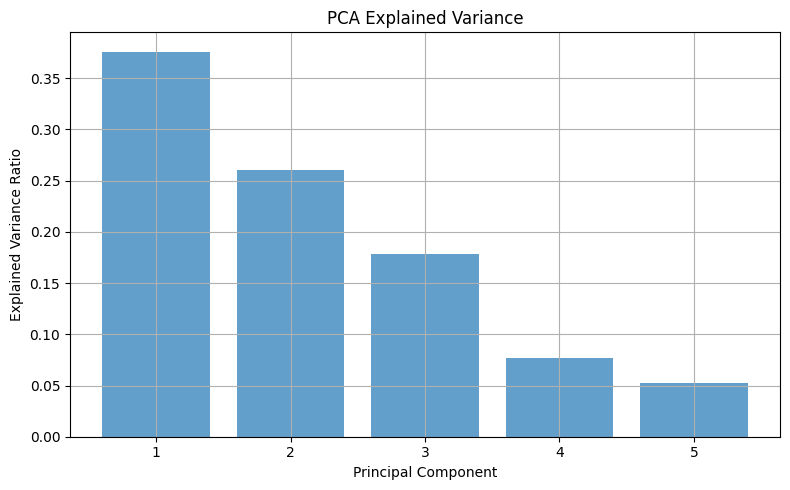

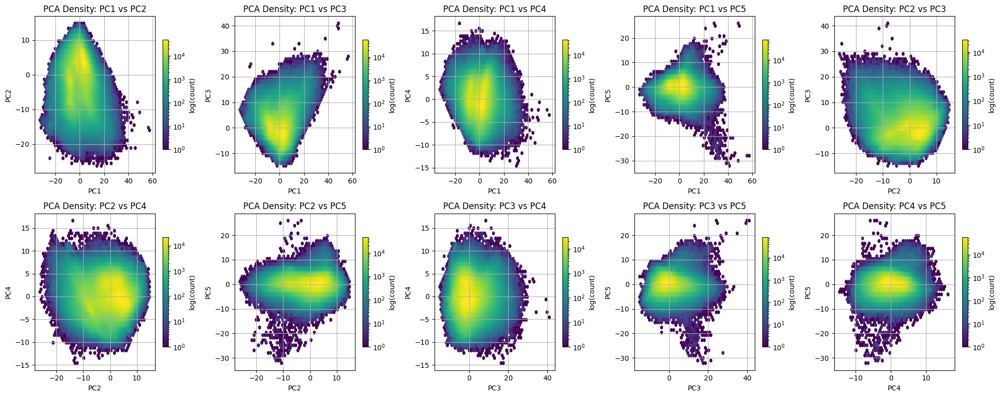

In [6]:
# * * * * * * * * * * * * * * * *
# Re-Do with Optimal n_components
# * * * * * * * * * * * * * * * *
n_components = 5

# * * * * * * * * * * * * * * * *
# PCA Fitting
# * * * * * * * * * * * * * * * *
n_samples = temp_data_scaled.shape[0]
n_batches = n_samples // batch_size + int(n_samples % batch_size != 0)

ipca = IncrementalPCA(n_components=n_components)

print("Fitting IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Fitting"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    ipca.partial_fit(batch)

X_pca = np.zeros((n_samples, n_components))

print("Transforming with IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Transforming"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    X_pca[start:end] = ipca.transform(batch)

# * * * * * * * * * * * * * * * *
# Plot Variance 
# * * * * * * * * * * * * * * * *
# Plot variance explained
plt.figure(figsize=(8, 5))
plt.bar(range(1, n_components + 1), ipca.explained_variance_ratio_, alpha=0.7)
plt.ylabel("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Pair-wise Plots
# * * * * * * * * * * * * * * * *
pcs = X_pca[:, :n_components]
pairs = list(combinations(range(n_components), 2))

n_pairs = len(pairs)
cols = 5  
rows = (n_pairs + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)

for idx, (x_idx, y_idx) in enumerate(pairs):
    row = idx // cols
    col = idx % cols
    ax = axes[row, col]
    
    hb = ax.hexbin(pcs[:, x_idx], pcs[:, y_idx], gridsize=50, cmap='viridis', bins='log')
    ax.set_xlabel(f"PC{x_idx + 1}")
    ax.set_ylabel(f"PC{y_idx + 1}")
    ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1}")
    ax.grid(True)
    
    cb = fig.colorbar(hb, ax=ax, shrink=0.7)
    cb.set_label('log(count)')

for idx in range(n_pairs, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()


==========Sample Size: 25==========
Final balanced sample size: 28858


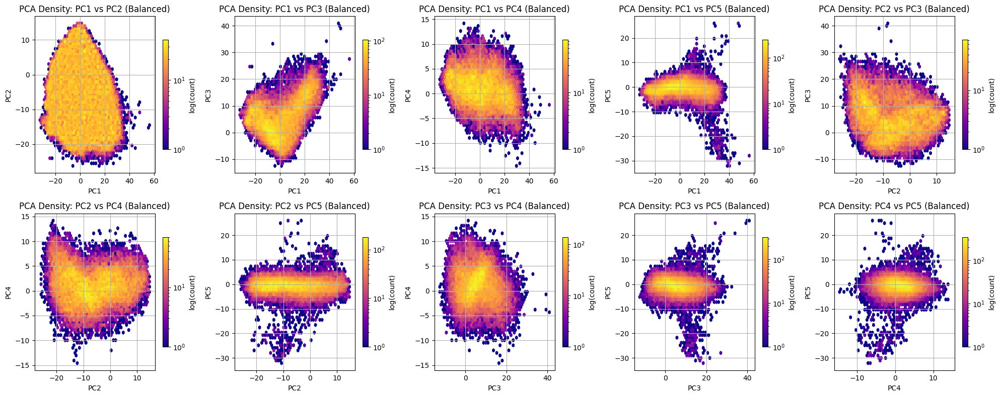

Balanced sample shape (original scale): torch.Size([28858, 120])
Saved figure to /workspace/density_plot.png


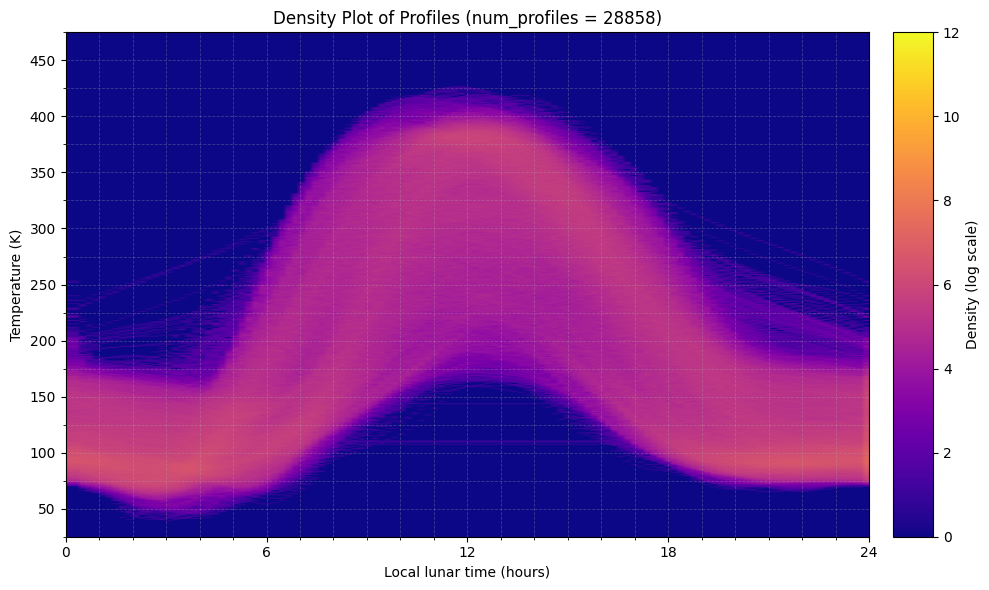

Saved /workspace/profiles-v2-pca-5-sample-25.pt
==========Sample Size: 50==========
Final balanced sample size: 53776


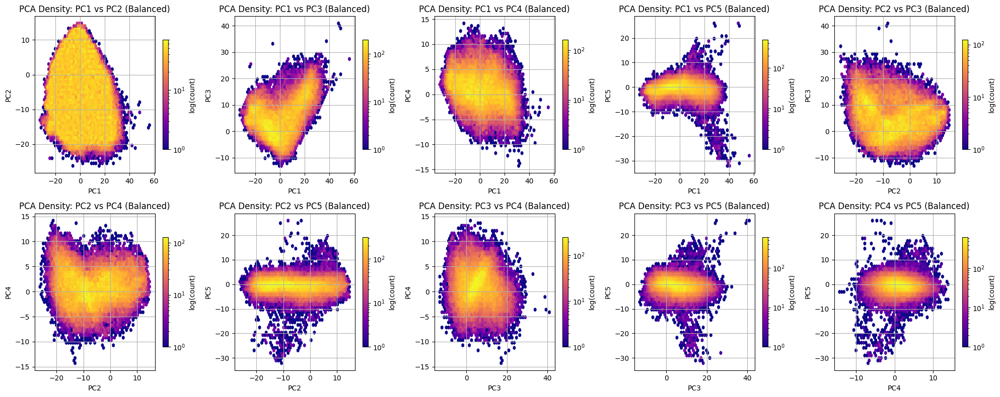

Balanced sample shape (original scale): torch.Size([53776, 120])
Saved figure to /workspace/density_plot.png


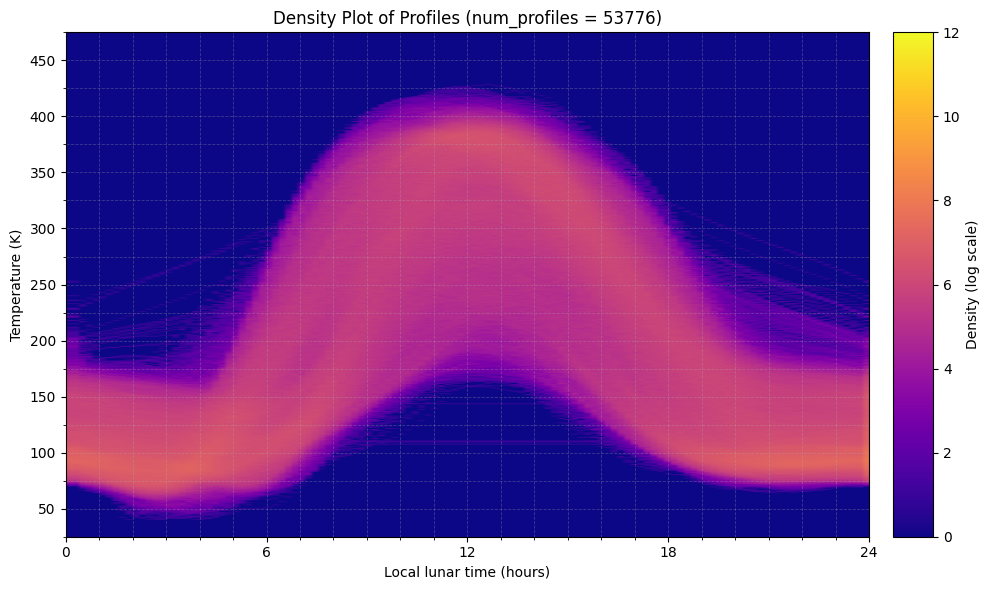

Saved /workspace/profiles-v2-pca-5-sample-50.pt
==========Sample Size: 75==========
Final balanced sample size: 76897


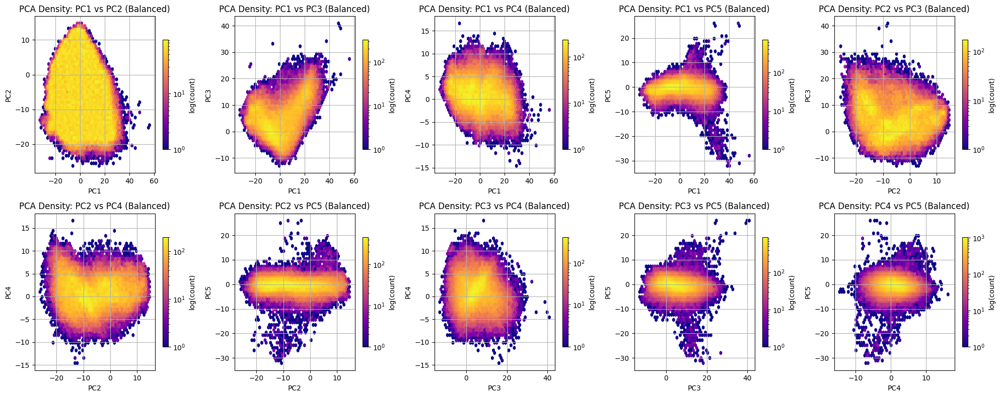

Balanced sample shape (original scale): torch.Size([76897, 120])
Saved figure to /workspace/density_plot.png


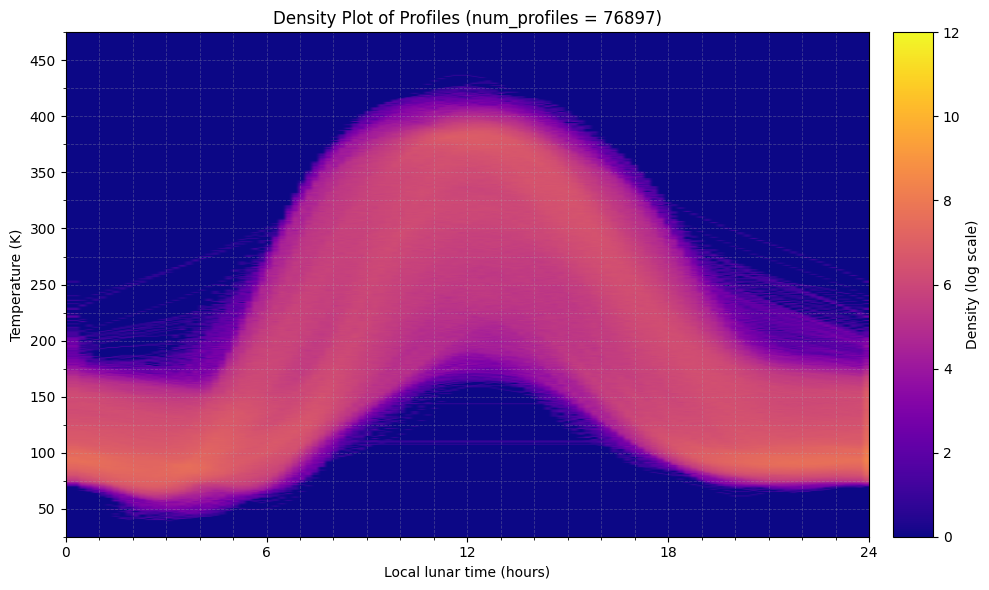

Saved /workspace/profiles-v2-pca-5-sample-75.pt
==========Sample Size: 100==========
Final balanced sample size: 98607


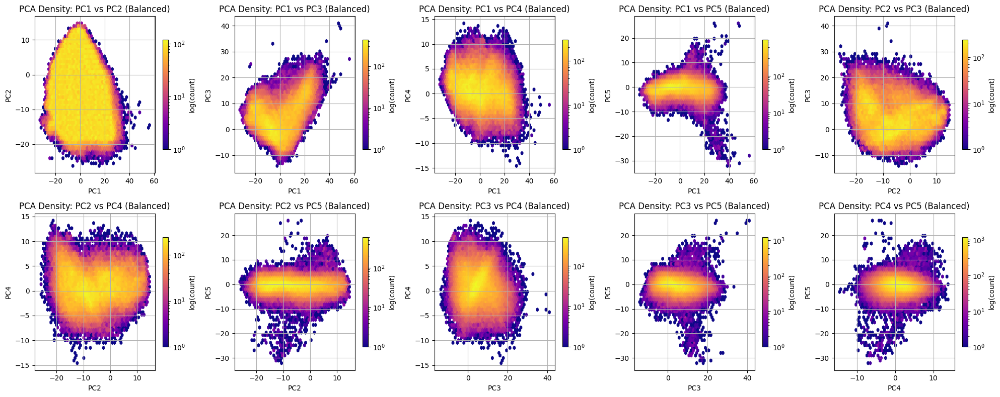

Balanced sample shape (original scale): torch.Size([98607, 120])
Saved figure to /workspace/density_plot.png


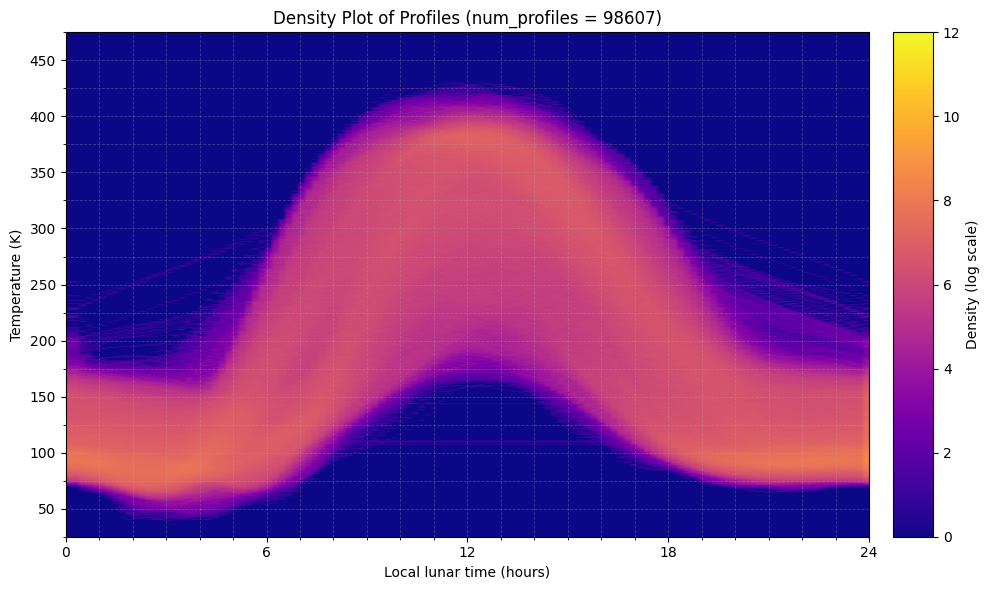

Saved /workspace/profiles-v2-pca-5-sample-100.pt
==========Sample Size: 150==========
Final balanced sample size: 138822


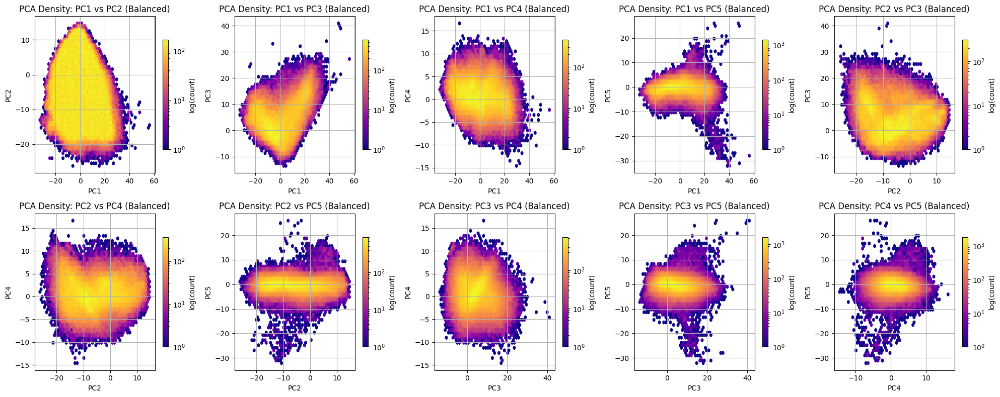

Balanced sample shape (original scale): torch.Size([138822, 120])
Saved figure to /workspace/density_plot.png


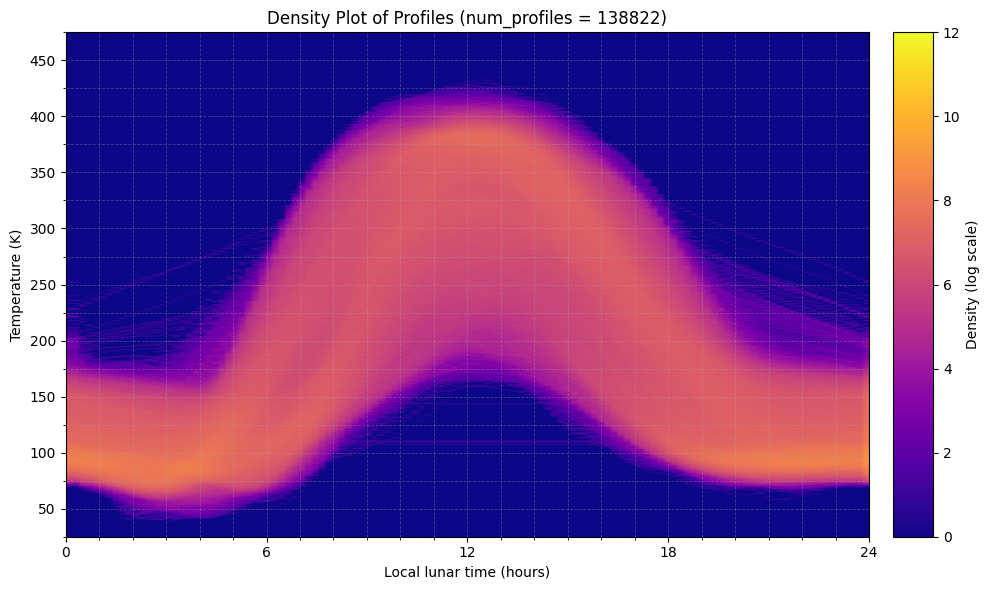

Saved /workspace/profiles-v2-pca-5-sample-150.pt
==========Sample Size: 200==========
Final balanced sample size: 176173


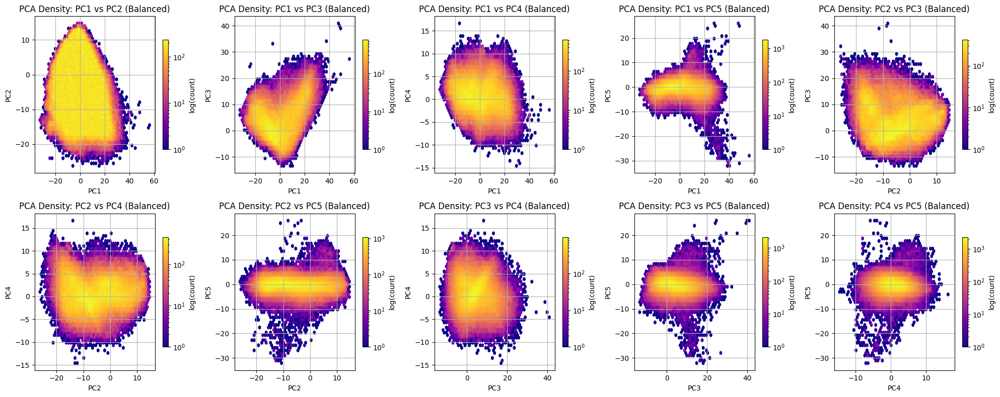

Balanced sample shape (original scale): torch.Size([176173, 120])
Saved figure to /workspace/density_plot.png


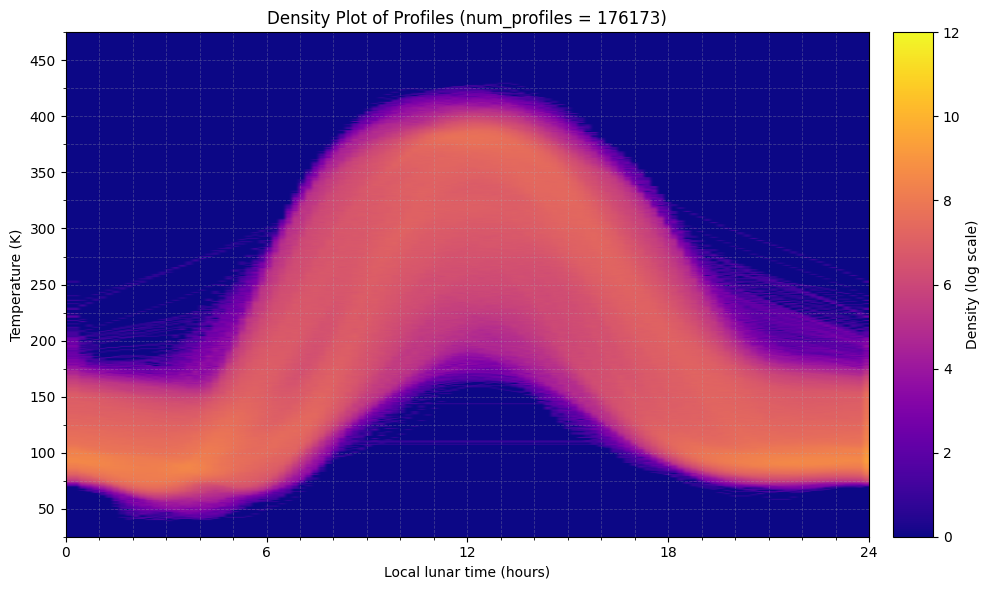

Saved /workspace/profiles-v2-pca-5-sample-200.pt
==========Sample Size: 250==========
Final balanced sample size: 211147


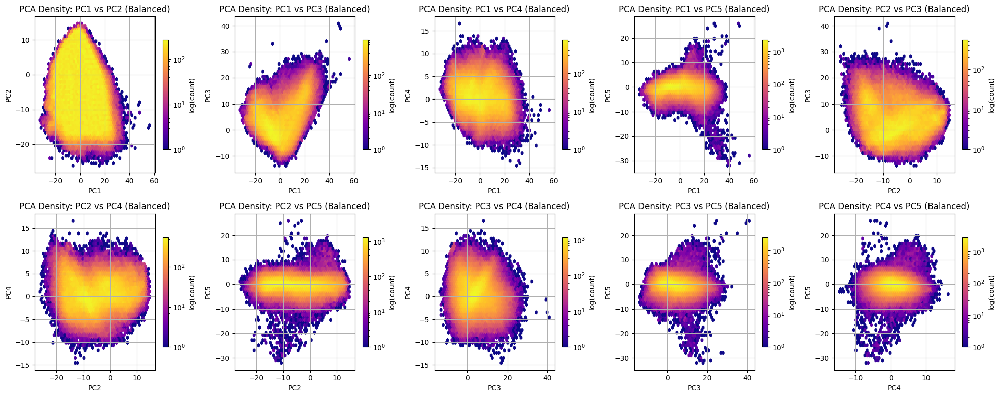

Balanced sample shape (original scale): torch.Size([211147, 120])
Saved figure to /workspace/density_plot.png


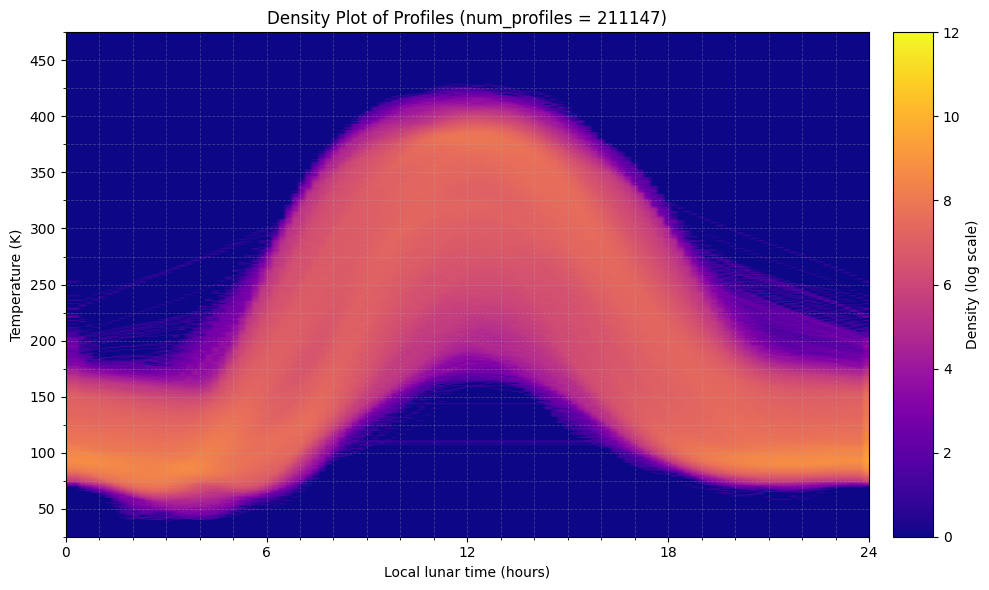

Saved /workspace/profiles-v2-pca-5-sample-250.pt
==========Sample Size: 500==========
Final balanced sample size: 363896


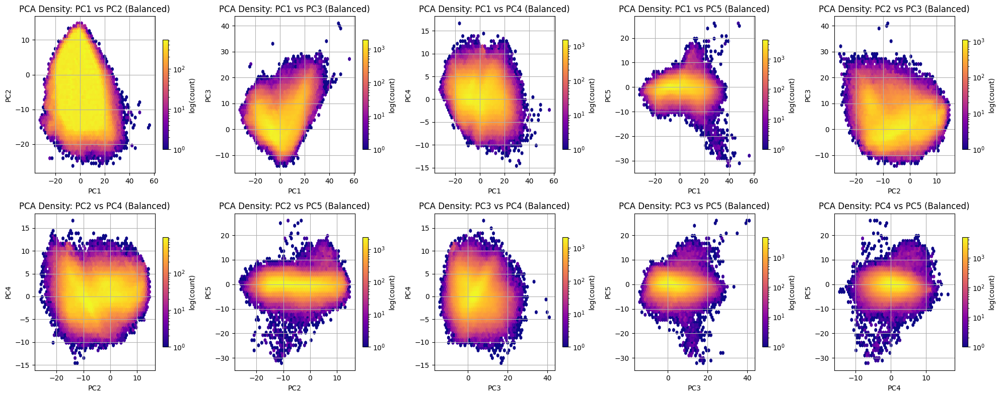

Balanced sample shape (original scale): torch.Size([363896, 120])
Saved figure to /workspace/density_plot.png


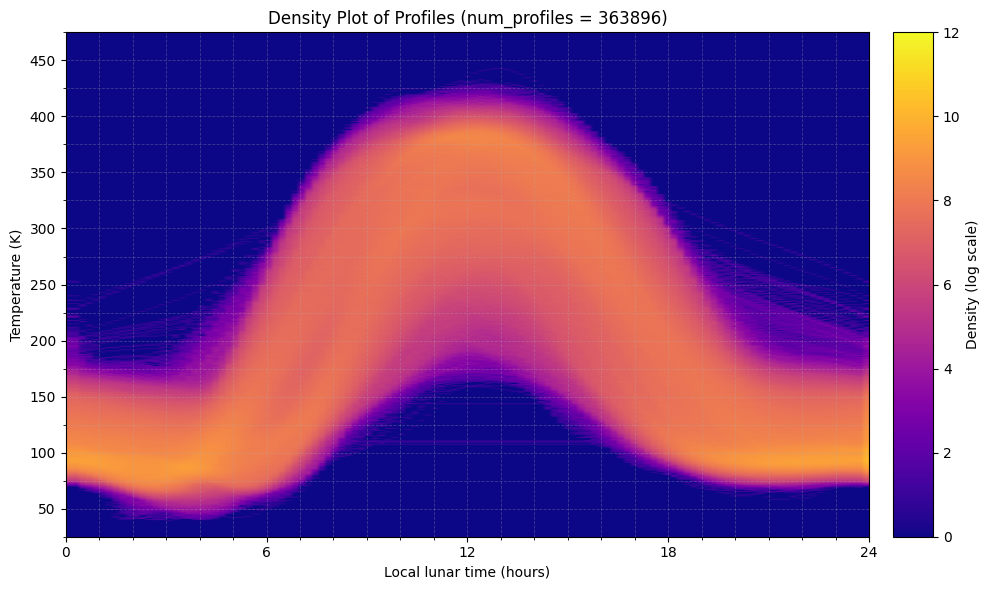

Saved /workspace/profiles-v2-pca-5-sample-500.pt


In [7]:
# * * * * * * * * * * * * * * * *
# Samples
# * * * * * * * * * * * * * * * *
sample_sizes = [25, 50, 75, 100, 150, 200, 250, 500]
grid_size = 50

for sample_size in sample_sizes:
    print(f"==========Sample Size: {sample_size}==========") 
    max_samples_per_cell = sample_size
    
    x_min, x_max = X_pca[:, 0].min(), X_pca[:, 0].max()
    y_min, y_max = X_pca[:, 1].min(), X_pca[:, 1].max()
    
    x_bins = np.linspace(x_min, x_max, grid_size + 1)
    y_bins = np.linspace(y_min, y_max, grid_size + 1)
    
    x_digitized = np.digitize(X_pca[:, 0], bins=x_bins) - 1
    y_digitized = np.digitize(X_pca[:, 1], bins=y_bins) - 1
    grid_keys = list(zip(x_digitized, y_digitized))
    
    cell_to_indices = defaultdict(list)
    for idx, cell in enumerate(grid_keys):
        if 0 <= cell[0] < grid_size and 0 <= cell[1] < grid_size:
            cell_to_indices[cell].append(idx)
    
    total_points = sum(len(indices) for indices in cell_to_indices.values())
    balanced_indices = []
    
    for cell, indices in cell_to_indices.items():
        proportion = len(indices) / total_points
        samples = min(int(proportion * total_points), max_samples_per_cell)
        if samples > 0:
            selected = np.random.choice(indices, samples, replace=False)
            balanced_indices.extend(selected)
    
    balanced_indices = np.array(balanced_indices)
    X_balanced = X_pca[balanced_indices]
    
    print(f"Final balanced sample size: {X_balanced.shape[0]}")
    
    # * * * * * * * * * * * * * * * *
    # Visualize Sampled Data PCA
    # * * * * * * * * * * * * * * * *
    pcs_balanced = X_balanced[:, :n_components]
    pairs = list(combinations(range(n_components), 2))
    
    n_pairs = len(pairs)
    cols = 5
    rows = (n_pairs + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)
    
    for idx, (x_idx, y_idx) in enumerate(pairs):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
    
        hb = ax.hexbin(pcs_balanced[:, x_idx], pcs_balanced[:, y_idx],
                       gridsize=50, cmap='plasma', bins='log')
        ax.set_xlabel(f"PC{x_idx + 1}")
        ax.set_ylabel(f"PC{y_idx + 1}")
        ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1} (Balanced)")
        ax.grid(True)
    
        cb = fig.colorbar(hb, ax=ax, shrink=0.7)
        cb.set_label('log(count)')
    
    for idx in range(n_pairs, rows * cols):
        fig.delaxes(axes.flatten()[idx])
    
    plt.tight_layout()
    plt.show()
    
    # * * * * * * * * * * * * * * * *
    # Visualize Sampled Data Density
    # * * * * * * * * * * * * * * * *
    temp_balanced_standardized = temp_data_scaled[balanced_indices]
    temp_balanced_unscaled = scaler.inverse_transform(temp_balanced_standardized)
    
    temp_tensor = torch.from_numpy(temp_balanced_unscaled).float()
    print("Balanced sample shape (original scale):", temp_tensor.shape)
    
    GenerateDensityPlot(temp_tensor, "/workspace/")

    torch_filename = f"/workspace/profiles-v2-pca-5-sample-{sample_size}.pt"
    torch.save(temp_tensor, torch_filename)
    print(f"Saved {torch_filename}")